# <center>Stock Market Price Prediction</center>


In [1]:
import yfinance as yf
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import seaborn as sns
import datetime, pytz
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error

from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM
from keras.layers import Dropout
from keras.layers import Activation

from plotly import tools
import chart_studio.plotly as py
from plotly.offline import init_notebook_mode, iplot
import plotly.graph_objs as go

from scipy import stats
import statsmodels.api as sm
import warnings
from itertools import product
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.graphics.tsaplots import plot_pacf
from matplotlib import pyplot
import xgboost as xgb
from xgboost import plot_importance, plot_tree
from sklearn.model_selection import TimeSeriesSplit, GridSearchCV, train_test_split
import pickle

plt.style.use('fivethirtyeight')

### Abstract

This project investigates the applicability of machine learning methods to forecasting price movements in Stock Market. Stock Market predictions have historically been a problem tackled by different singular approaches even though markets are influenced by many different factors. The proposed model leverages XGBoost to predict a stock price, long short-term memory (LSTM) and ARIMA approach to predict a multiplier. Sentiment analysis is then used to capture the impact of various factors on stock prices, including market trends, economic indicators, and public opinion. The results of the model are compared to traditional prediction models using historical stock data, and it is shown that the proposed model provides improved accuracy in predicting future stock prices. The proposed model represents a significant step forward in stock price prediction, providing a more comprehensive and effective approach to predicting stock prices based on multiple factors.

## 1. Import and prepare data

In [2]:
# Stock abbreviation
stock_symbol = '^DJI'

# Set the time period
start_date = '1992-01-02'
end_date = '2023-10-31'
split_date = '01-Jan-2018'

# Get the data for the stock
stock_data = yf.Ticker(stock_symbol)

# Fetch the historical prices for the chosen time period
stock_df = stock_data.history(start=start_date, end=end_date)

stock_df.reset_index(inplace=True)

# Add a new column Weighted_Price
stock_df['Weighted_Price'] = (stock_df['Open'] + stock_df['Low'] + stock_df['High'] + 2 * stock_df['Close']) / 5

In [3]:
# First replace N/A value if exist with zero

stock_df['Volume'].fillna(value=0, inplace=True)
stock_df['Dividends'].fillna(value=0, inplace=True)
stock_df['Stock Splits'].fillna(value=0, inplace=True)

stock_df['Open'].fillna(method='ffill', inplace=True)
stock_df['High'].fillna(method='ffill', inplace=True)
stock_df['Low'].fillna(method='ffill', inplace=True)
stock_df['Close'].fillna(method='ffill', inplace=True)

stock_df.head()

,Date,Open,High,Low,Close,Volume,Dividends,Stock Splits,Weighted_Price
0,1992-01-02 00:00:00-05:00,3152.100098,3172.629883,3139.310059,3172.399902,23550000,0.0,0.0,3161.767969
1,1992-01-03 00:00:00-05:00,3172.399902,3210.639893,3165.919922,3201.500000,23620000,0.0,0.0,3190.391943
2,1992-01-06 00:00:00-05:00,3201.500000,3213.330078,3191.860107,3200.100098,27280000,0.0,0.0,3201.378076
3,1992-01-07 00:00:00-05:00,3200.100098,3210.199951,3184.479980,3204.800049,25510000,0.0,0.0,3200.876025
4,1992-01-08 00:00:00-05:00,3204.800049,3229.199951,3185.820068,3203.899902,29040000,0.0,0.0,3205.523975


## 2. Analyze data 

In [4]:
stock_df.shape

(8017, 9)

In [5]:
stock_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8017 entries, 0 to 8016
Data columns (total 9 columns):
 #   Column          Non-Null Count  Dtype                           
---  ------          --------------  -----                           
 0   Date            8017 non-null   datetime64[ns, America/New_York]
 1   Open            8017 non-null   float64                         
 2   High            8017 non-null   float64                         
 3   Low             8017 non-null   float64                         
 4   Close           8017 non-null   float64                         
 5   Volume          8017 non-null   int64                           
 6   Dividends       8017 non-null   float64                         
 7   Stock Splits    8017 non-null   float64                         
 8   Weighted_Price  8017 non-null   float64                         
dtypes: datetime64[ns, America/New_York](1), float64(7), int64(1)
memory usage: 563.8 KB


In [6]:
stock_df.index

RangeIndex(start=0, stop=8017, step=1)

In [7]:
stock_df.describe()

,Open,High,Low,Close,Volume,Dividends,Stock Splits,Weighted_Price
count,8017.000000,8017.000000,8017.000000,8017.000000,8.017000e+03,8017.0,8017.0,8017.000000
mean,14127.591048,14211.925023,14039.816917,14130.445858,1.922005e+08,0.0,0.0,14128.044941
std,8639.671052,8683.344863,8592.524169,8639.436201,1.309618e+08,0.0,0.0,8638.573531
min,3136.600098,3172.629883,3095.790039,3136.600098,8.410000e+06,0.0,0.0,3151.444043
25%,8745.040039,8834.929688,8647.599609,8745.450195,7.942000e+07,0.0,0.0,8745.361914
50%,11028.740234,11117.080078,10965.450195,11031.589844,1.903900e+08,0.0,0.0,11034.225781
75%,17783.779297,17868.179688,17697.519531,17787.199219,2.766100e+08,0.0,0.0,17787.574219
max,36722.601562,36952.648438,36636.000000,36799.648438,9.159900e+08,0.0,0.0,36761.227344


Creating Weekly Rows for the better Data Visualization

In [8]:
# create valid date range
start = datetime.datetime(1992, 1, 1, 0, 0, 0, 0, pytz.UTC)
end = datetime.datetime(2023, 10, 31, 0, 0, 0, 0, pytz.UTC)

# find rows between start and end time and find the first row (00:00 monday morning)
weekly_rows = stock_df[(stock_df['Date'] >= start) & (stock_df['Date'] <= end)].groupby([pd.Grouper(key='Date', freq='W-MON')]).first().reset_index()
weekly_rows.head()

,Date,Open,High,Low,Close,Volume,Dividends,Stock Splits,Weighted_Price
0,1992-01-06 00:00:00-05:00,3152.100098,3172.629883,3139.310059,3172.399902,23550000,0.0,0.0,3161.767969
1,1992-01-13 00:00:00-05:00,3200.100098,3210.199951,3184.479980,3204.800049,25510000,0.0,0.0,3200.876025
2,1992-01-20 00:00:00-05:00,3185.600098,3248.879883,3182.919922,3246.199951,24220000,0.0,0.0,3221.959961
3,1992-01-27 00:00:00-05:00,3254.000000,3254.469971,3215.340088,3223.399902,24160000,0.0,0.0,3234.121973
4,1992-02-03 00:00:00-05:00,3240.600098,3275.489990,3239.939941,3272.100098,24960000,0.0,0.0,3260.046045


In the bottom graph we see historical prices plotted for the entire period. The Global Financial Crisis and Covid-19 marked two of the biggest shocks in the market. In this case they will only be noted, not excluded from the model, as they have had quite a large impact on the market for quite some time to come.

In [9]:
#Create a DataFrame
df = pd.DataFrame(weekly_rows)
df['Date'] = pd.to_datetime(df['Date'])  #Convert the 'Date' column to datetime format

#Create traces for Open, High, and Close
trace_open = go.Scatter(x=df['Date'], y=df['Open'], mode='markers', name='Open')
trace_high = go.Scatter(x=df['Date'], y=df['High'], mode='markers', name='High')
trace_close = go.Scatter(x=df['Date'], y=df['Close'], mode='markers', name='Close')
# trace_wp = go.Scatter(x=df['Date'], y=df['Weighted_Price'], mode='markers', name='Weighted Price')

#Create traces for the vertical lines representing the GFC and COVID-19 effects
gfc_date = pd.to_datetime('2009-03-01')
covid_effect_date = pd.to_datetime('2020-03-01')

trace_gfc_effect = go.Scatter(
    x=[gfc_date, gfc_date],
    y=[min(df['Open']), max(df['High'])],
    mode='lines',
    line=dict(color='orange', dash='dash'),
    name='Global Financial Crisis (GFC) Effect'
)

trace_covid_effect = go.Scatter(
    x=[covid_effect_date, covid_effect_date],
    y=[min(df['Open']), max(df['High'])],
    mode='lines',
    line=dict(color='red', dash='dash'),
    name='COVID-19 Effect'
)

#Create layout
layout = go.Layout(
    title='Historical Dow Jones Prices',
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label='1m',
                     step='month',
                     stepmode='backward'),
                dict(count=6,
                     label='6m',
                     step='month',
                     stepmode='backward'),
                dict(count=12,
                     label='1y',
                     step='month',
                     stepmode='backward'),
                dict(step='all')
            ])
        ),
        rangeslider=dict(
            visible = True
        ),
        type='date'
    ),
    yaxis=dict(title='Stock Price'),
)

# Create the figure
fig = go.Figure(data=[trace_open, trace_high, trace_close, trace_gfc_effect, trace_covid_effect], layout=layout)

# Show the plot
fig.show()


In the bottom graph we see the weighted price distribution.

In [10]:
# Create a DataFrame
df = pd.DataFrame(weekly_rows)
df['Date'] = pd.to_datetime(df['Date'])  # Convert the 'Date' column to datetime format

# Create a trace for the volume
trace_volume = go.Scatter(x=df['Date'], y=df['Weighted_Price'], mode='lines', name='Weighted Price', line=dict(color='green'))

# Create traces for the vertical lines representing the GFC and COVID-19 effects
gfc_date = pd.to_datetime('2007-01-01')
covid_effect_date = pd.to_datetime('2020-03-01')

trace_gfc_effect = go.Scatter(
    x=[gfc_date, gfc_date],
    y=[min(df['Weighted_Price']), max(df['Weighted_Price'])],
    mode='lines',
    line=dict(color='orange', dash='dash'),
    name='Global Financial Crisis (GFC) Effect'
)

trace_covid_effect = go.Scatter(
    x=[covid_effect_date, covid_effect_date],
    y=[min(df['Weighted_Price']), max(df['Weighted_Price'])],
    mode='lines',
    line=dict(color='red', dash='dash'),
    name='COVID-19 Effect'
)

# Create layout
layout = go.Layout(
    title='Stock Market Volume with GFC and COVID-19 Effects',
    xaxis=dict(title='Date'),
    yaxis=dict(title='Weighted Price'),
)

# Create the figure
fig = go.Figure(data=[trace_volume, trace_gfc_effect, trace_covid_effect], layout=layout)

# Show the plot
fig.show()


## 3. Time Series Forecasting

Time Series data is a series of data points indexed in time order. Time series data is everywhere, so manipulating them is important for any data analyst or data scientist. Time Series have several key features such as trend, seasonality, and noise.Forecasting is the process of making predictions of the future, based on past and present data.

#### Predicting using LSTM



In the first section, we use LSTM (Long short-term memory ). LSTM units are units of a recurrent neural network (RNN). An RNN composed of LSTM units is often called an LSTM network (or just LSTM). A common LSTM unit is composed of a cell, an input gate, an output gate and a forget gate. The cell remembers values over arbitrary time intervals and the three gates regulate the flow of information into and out of the cell.

A weighted daily price has also been added for prediction purposes. The data is merged based on the date, which is 01.01.2018.

In [11]:
data = stock_df[['Date','Weighted_Price']]

In [12]:
data.head()

,Date,Weighted_Price
0,1992-01-02 00:00:00-05:00,3161.767969
1,1992-01-03 00:00:00-05:00,3190.391943
2,1992-01-06 00:00:00-05:00,3201.378076
3,1992-01-07 00:00:00-05:00,3200.876025
4,1992-01-08 00:00:00-05:00,3205.523975


In [13]:
# split data
data_train = data.loc[data['Date'] <= split_date].copy()
data_test = data.loc[data['Date'] > split_date].copy()

In [14]:
# Set "Date" column as the index and remove the column
data_train.set_index('Date', inplace=True)
data_test.set_index('Date', inplace=True)

In [15]:
data_train.head()

,Weighted_Price
Date,
1992-01-02 00:00:00-05:00,3161.767969
1992-01-03 00:00:00-05:00,3190.391943
1992-01-06 00:00:00-05:00,3201.378076
1992-01-07 00:00:00-05:00,3200.876025
1992-01-08 00:00:00-05:00,3205.523975


In [16]:

training_set = data_train.Weighted_Price
training_set = np.reshape(training_set, (len(training_set), 1))
sc = MinMaxScaler()
training_set = sc.fit_transform(training_set)
X_train = training_set[0:len(training_set)-1]
y_train = training_set[1:len(training_set)]
X_train = np.reshape(X_train, (len(X_train), 1, 1))

In [17]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=data['Date'], y=data['Weighted_Price'], mode='lines', name='Weighted Price'))
fig.update_layout(title='Weighted Price', xaxis_title='Datetime', yaxis_title='Weighted Price USD')
fig.show()

In [18]:
# Plot the data using go.Scatter with different colors
fig = go.Figure()
fig.add_trace(go.Scatter(x=data_train.index, y=data_train['Weighted_Price'], mode='lines' ,name='Train set', line=dict(color='green')))
fig.add_trace(go.Scatter(x=data_test.index, y=data_test['Weighted_Price'], mode='lines', name='Test set', line=dict(color='blue')))
fig.update_layout(title='Dow Jones Weighted price ', xaxis_title='Time', yaxis_title='USD $')
fig.add_vline(x=split_date, line_dash="dash", line_color="red") #To be adjust
fig.show()


In [19]:
model = Sequential()
model.add(LSTM(128,activation="sigmoid",input_shape=(1,1)))
model.add(Dropout(0.2))
model.add(Dense(1))
model.compile(loss='mean_squared_error', optimizer='adam')
model.fit(X_train, y_train, epochs=100, batch_size=50, verbose=2)

Epoch 1/100
131/131 - 5s - loss: 0.1037 - 5s/epoch - 35ms/step
Epoch 2/100
131/131 - 1s - loss: 0.0666 - 886ms/epoch - 7ms/step
Epoch 3/100
131/131 - 1s - loss: 0.0536 - 921ms/epoch - 7ms/step
Epoch 4/100
131/131 - 1s - loss: 0.0432 - 931ms/epoch - 7ms/step
Epoch 5/100
131/131 - 1s - loss: 0.0351 - 945ms/epoch - 7ms/step
Epoch 6/100
131/131 - 1s - loss: 0.0293 - 949ms/epoch - 7ms/step
Epoch 7/100
131/131 - 1s - loss: 0.0245 - 975ms/epoch - 7ms/step
Epoch 8/100
131/131 - 1s - loss: 0.0211 - 1s/epoch - 8ms/step
Epoch 9/100
131/131 - 1s - loss: 0.0183 - 1s/epoch - 10ms/step
Epoch 10/100
131/131 - 1s - loss: 0.0151 - 1s/epoch - 11ms/step
Epoch 11/100
131/131 - 1s - loss: 0.0133 - 1s/epoch - 9ms/step
Epoch 12/100
131/131 - 1s - loss: 0.0120 - 1s/epoch - 8ms/step
Epoch 13/100
131/131 - 1s - loss: 0.0111 - 984ms/epoch - 8ms/step
Epoch 14/100
131/131 - 1s - loss: 0.0096 - 948ms/epoch - 7ms/step
Epoch 15/100
131/131 - 1s - loss: 0.0087 - 967ms/epoch - 7ms/step
Epoch 16/100
131/131 - 1s - loss: 

In [20]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 128)               66560     
                                                                 
 dropout (Dropout)           (None, 128)               0         
                                                                 
 dense (Dense)               (None, 1)                 129       
                                                                 
Total params: 66689 (260.50 KB)
Trainable params: 66689 (260.50 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [21]:
# Making the predictions
test_set = data_test['Weighted_Price']
inputs = np.reshape(test_set, (len(test_set), 1))
inputs = sc.transform(inputs)
inputs = np.reshape(inputs, (len(inputs), 1, 1))
predicted_stock_price = model.predict(inputs)
predicted_stock_price = sc.inverse_transform(predicted_stock_price)

46/46 [==============================] - 1s 5ms/step


In [22]:
data_test['Weighted_Price_Prediction'] = predicted_stock_price
data_all = pd.concat([data_test, data_train], sort=False)

In [23]:
#saving the predicted values in a common data frame for future comparision
final_data = data_all
final_data = final_data.reset_index()
final_data = final_data.rename(columns={'Weighted_Price_Prediction': 'lstm'})
final_data = final_data[['Date','Weighted_Price','lstm']]

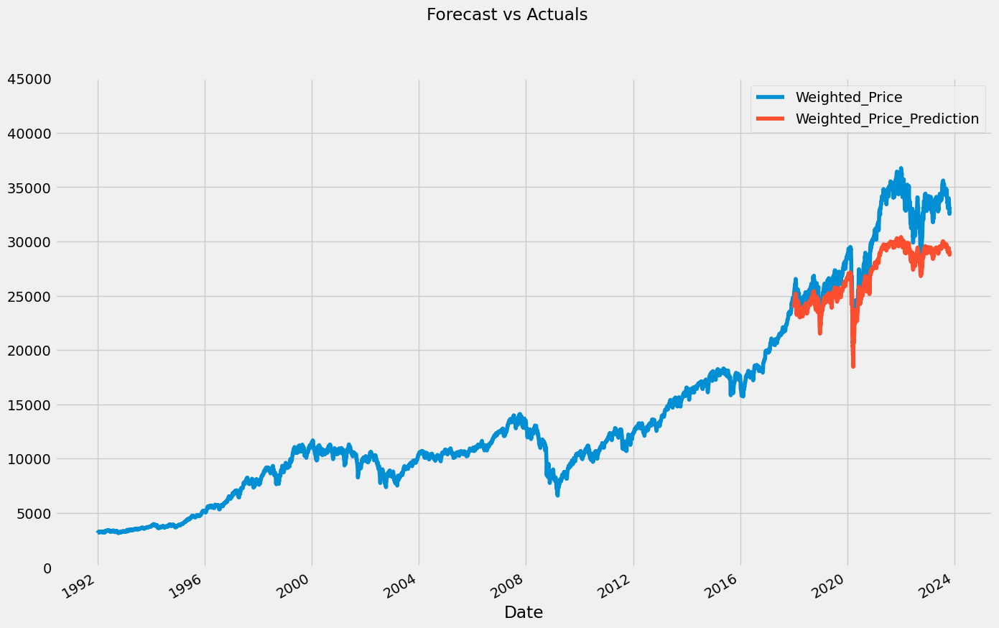

In [24]:
# Plot the forecast with the actuals
f, ax = plt.subplots(1)
f.set_figheight(10)
f.set_figwidth(15)
data_all[['Weighted_Price', 'Weighted_Price_Prediction']].plot(ax=ax,
                                              style=['-','-'])
ax.set_ylim(0, 45000)
plot = plt.suptitle('Forecast vs Actuals')

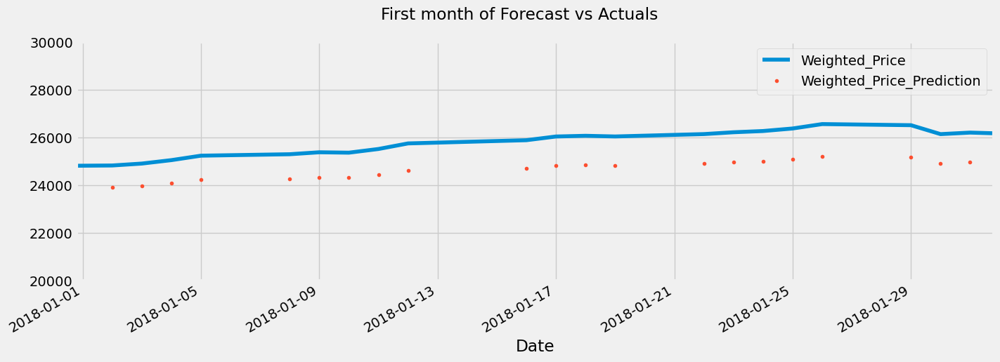

In [25]:
# Plot the forecast with the actuals
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(15)
data_all[['Weighted_Price','Weighted_Price_Prediction']].plot(ax=ax,
                                              style=['-','.'])
ax.set_xbound(lower='2018-01-01', upper='2018-02-01')
ax.set_ylim(20000, 30000)
plot = plt.suptitle('First month of Forecast vs Actuals')

In [26]:
def mean_absolute_percentage_error(y_true, y_pred): 
    """Calculates MAPE given y_true and y_pred"""
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

In [27]:
MSE = round(mean_squared_error(y_true=data_test['Weighted_Price'],
                   y_pred=data_test['Weighted_Price_Prediction']), 2)

In [28]:
MAE = round(mean_absolute_error(y_true=data_test['Weighted_Price'],
                   y_pred=data_test['Weighted_Price_Prediction']), 2)

In [29]:
MAPE = mean_absolute_percentage_error(y_true=data_test['Weighted_Price'], y_pred=data_test['Weighted_Price_Prediction'])

#### Error Metrics On Test Set

In [30]:
print(f'MSE error is {MSE:.2f}')
print(f'MAE error is {MAE:.2f}')
print(f'MAPE error is {MAPE:.2f}%')

MSE error is 10666711.29
MAE error is 2792.86
MAPE error is 8.79%


#### Time Series forecasting with XGBoost

In [31]:
data = stock_df[['Date','Weighted_Price']]

In [32]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=data['Date'], y=data['Weighted_Price'], mode='lines', name='Weighted Price'))
fig.update_layout(title='Weighted Price', xaxis_title='Date', yaxis_title='Weighted Price USD')
fig.show()

In [33]:
data.set_index('Date', inplace=True)

##### Finding the best parameters

In [34]:
# data = stock_df[['Date','Weighted_Price']]
# X = data.drop('Date', axis=1)
# y = data['Weighted_Price']

# # Split your dataset
# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# # Define the parameter grid
# param_grid = {'objective' :['reg:squarederror', 'multi:softmax', 'rank:pairwise', 'reg:huber', 'reg:gamma'],\
#               'max_depth' : [1, 2, 3, 4, 5, 6],'n_estimators': [50, 100, 200], 'learning_rate': [0.01, 0.1, 0.2]\
#               ,'min_child_weight' : [5, 10, 15, 20, 25], \
#               'colsample_bytree' : [0.1, 0.3, 0.01, 0.4], 'alpha' : [5, 10, 15] \
#              }


# # Create an XGBRegressor object
# xgb_model = XGBRegressor()

# # Create the GridSearchCV object
# grid_search = GridSearchCV(estimator=xgb_model, param_grid=param_grid, scoring='neg_mean_squared_error', cv=5, n_jobs=-1)

# # Fit the model
# grid_search.fit(X_train, y_train)

# # Print the best parameters and best score
# print("Best Parameters: ", grid_search.best_params_)
# print("Best Negative Mean Squared Error: ", grid_search.best_score_)

# # Evaluate on the test set
# y_pred = grid_search.best_estimator_.predict(X_test)
# mse = mean_squared_error(y_test, y_pred)
# print("Mean Squared Error on Test Set: ", mse)


Best Parameters:  {'alpha': 15, 'colsample_bytree': 0.1, 'learning_rate': 0.1, 'max_depth': 6, 'min_child_weight': 5, 'n_estimators': 200, 'objective': 'reg:squarederror'}

In [35]:
# with open('xgb_grid_search_results.pkl', 'wb') as file:
#     pickle.dump(grid_search, file)
    
# Load the saved grid search results using pickle
with open('xgb_grid_search_results.pkl', 'rb') as file:
    loaded_grid_search = pickle.load(file)

# Access the best parameters and other attributes
params = loaded_grid_search.best_params_
cv_results = loaded_grid_search.cv_results_

In [36]:
data = stock_df[['Date','Weighted_Price']]

In [37]:
# Spit Data
data_train = data.loc[data['Date'] <= split_date].copy()
data_test = data.loc[data['Date'] > split_date].copy()

# Set "Date" column as the index and remove the column
data_train.set_index('Date', inplace=True)
data_test.set_index('Date', inplace=True)

In [38]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=data_train.index, y=data_train['Weighted_Price'], mode='lines' ,name='Train set', line=dict(color='green')))
fig.add_trace(go.Scatter(x=data_test.index, y=data_test['Weighted_Price'], mode='lines', name='Test set', line=dict(color='blue')))
fig.update_layout(title='Dow Jones Weighted price ', xaxis_title='Time', yaxis_title='USD $')
fig.show()


In [39]:
# Creates time series features from datetime index

def create_features(df, label=None):
    df['date'] = df.index
    df['hour'] = df['date'].dt.hour
    df['dayofweek'] = df['date'].dt.dayofweek
    df['quarter'] = df['date'].dt.quarter
    df['month'] = df['date'].dt.month
    df['year'] = df['date'].dt.year
    df['dayofyear'] = df['date'].dt.dayofyear
    df['dayofmonth'] = df['date'].dt.day
    
    X = df[['hour','dayofweek','quarter','month','year',
           'dayofyear','dayofmonth',]]
    if label:
        y = df[label]
        return X, y
    return X

In [40]:
X_train, y_train = create_features(data_train, label='Weighted_Price')
X_test, y_test = create_features(data_test, label='Weighted_Price')

In [41]:
model =  xgb.XGBRegressor(objective =params['objective'], min_child_weight=params['min_child_weight'],\
                          booster='gbtree', colsample_bytree = params['colsample_bytree'],\
                          learning_rate = params['learning_rate'],
                max_depth = params['max_depth'], alpha = params['alpha'],\
                          n_estimators = params['n_estimators'])

model.fit(X_train, y_train,
        eval_set=[(X_train, y_train), (X_test, y_test)],
#         early_stopping_rounds=50,
       verbose=True)

[0]	validation_0-rmse:4571.58659	validation_1-rmse:19522.39970
[1]	validation_0-rmse:4127.26835	validation_1-rmse:18441.88441
[2]	validation_0-rmse:4127.26835	validation_1-rmse:18441.87352
[3]	validation_0-rmse:4126.17326	validation_1-rmse:18442.52058
[4]	validation_0-rmse:4126.17326	validation_1-rmse:18442.51211
[5]	validation_0-rmse:3727.29617	validation_1-rmse:17472.39340
[6]	validation_0-rmse:3727.29617	validation_1-rmse:17472.37605
[7]	validation_0-rmse:3726.32157	validation_1-rmse:17472.95956
[8]	validation_0-rmse:3726.32157	validation_1-rmse:17472.94618
[9]	validation_0-rmse:3725.53162	validation_1-rmse:17473.49047
[10]	validation_0-rmse:3725.48846	validation_1-rmse:17473.47245
[11]	validation_0-rmse:3725.45224	validation_1-rmse:17473.45944
[12]	validation_0-rmse:3725.42287	validation_1-rmse:17473.44887
[13]	validation_0-rmse:3724.78280	validation_1-rmse:17473.95768
[14]	validation_0-rmse:3724.75781	validation_1-rmse:17473.93762
[15]	validation_0-rmse:3724.73755	validation_1-rms

[128]	validation_0-rmse:930.06709	validation_1-rmse:10504.86083
[129]	validation_0-rmse:930.03875	validation_1-rmse:10504.87193
[130]	validation_0-rmse:930.03222	validation_1-rmse:10504.86952
[131]	validation_0-rmse:930.03140	validation_1-rmse:10504.87328
[132]	validation_0-rmse:930.03130	validation_1-rmse:10504.86906
[133]	validation_0-rmse:930.00323	validation_1-rmse:10504.89677
[134]	validation_0-rmse:930.00314	validation_1-rmse:10504.89407
[135]	validation_0-rmse:930.00324	validation_1-rmse:10504.89226
[136]	validation_0-rmse:930.00324	validation_1-rmse:10504.89033
[137]	validation_0-rmse:930.00321	validation_1-rmse:10504.88841
[138]	validation_0-rmse:880.47710	validation_1-rmse:10351.24280
[139]	validation_0-rmse:880.47706	validation_1-rmse:10351.24154
[140]	validation_0-rmse:880.47708	validation_1-rmse:10351.23857
[141]	validation_0-rmse:880.47051	validation_1-rmse:10351.23762
[142]	validation_0-rmse:880.44690	validation_1-rmse:10351.25143
[143]	validation_0-rmse:880.44688	valida

XGBRegressor(alpha=15, base_score=None, booster='gbtree', callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=0.1, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.1, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=6, max_leaves=None,
             min_child_weight=5, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=200, n_jobs=None,
             num_parallel_tree=None, ...)

In [42]:
data_test['Weighted_Price_Prediction'] = model.predict(X_test)
data_all = pd.concat([data_test, data_train], sort=False)

#adding to final data for comparision
final_data = pd.merge(final_data, data_all, sort=False)
final_data = final_data.rename(columns={'Weighted_Price_Prediction': 'xgboost'})
final_data = final_data[['date','Weighted_Price','lstm','xgboost']]

Feature Importances

Feature importance is a great way to get a general idea about which features the model is relying on most to make the prediction. This is a metric that simply sums up how many times each feature is split on.

We can see that day of year was most commonly used to split trees, while year came in next. Quarter has low importance due to the fact that it could be created by different day of year splits.

<Axes: title={'center': 'Feature importance'}, xlabel='F score', ylabel='Features'>

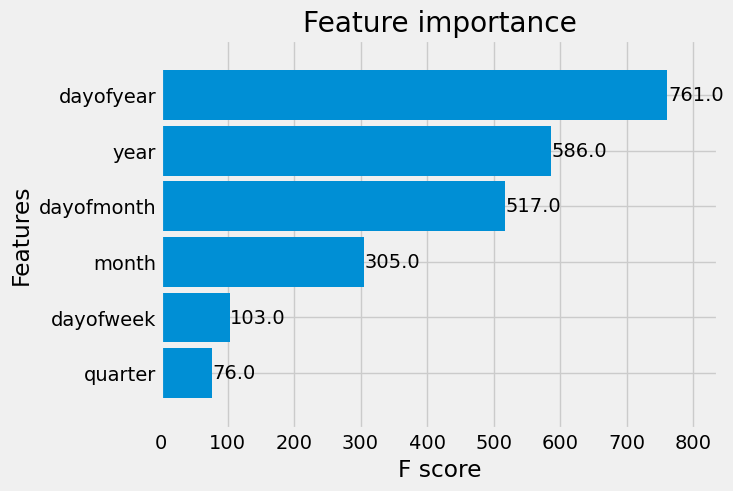

In [43]:
plot_importance(model, height=0.9)

Forecast on Test Set

In [44]:
data_test['Weighted_Price_Prediction'] = model.predict(X_test)
data_all = pd.concat([data_test, data_train], sort=False)

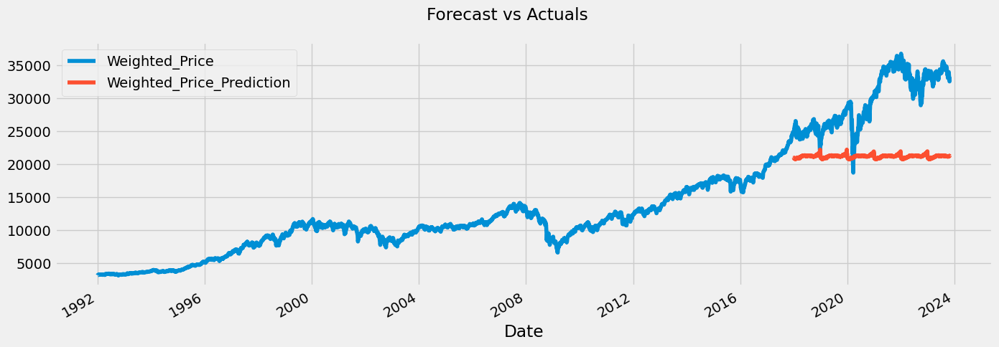

In [45]:
data_all[['Weighted_Price','Weighted_Price_Prediction']].plot(figsize=(15, 5))
plot = plt.suptitle('Forecast vs Actuals')

In [46]:
MSE = mean_squared_error(y_true=data_test['Weighted_Price'],
                   y_pred=data_test['Weighted_Price_Prediction'])

In [47]:
MAE = mean_absolute_error(y_true=data_test['Weighted_Price'],
                   y_pred=data_test['Weighted_Price_Prediction'])

In [48]:
MAPE = mean_absolute_percentage_error(y_true=data_test['Weighted_Price'],
                   y_pred=data_test['Weighted_Price_Prediction'])

#### Error Metrics On Test Set

In [49]:
print(f'MSE error is {MSE:.2f}')
print(f'MAE error is {MAE:.2f}')
print(f'MAPE error is {MAPE:.2f}%')

MSE error is 89450213.79
MAE error is 8537.56
MAPE error is 27.34%


In [50]:
data_test['error'] = data_test['Weighted_Price'] - data_test['Weighted_Price_Prediction']
data_test['abs_error'] = data_test['error'].apply(np.abs)
error_by_day = data_test.groupby(['year','month','dayofmonth']) \
    .mean()[['Weighted_Price','Weighted_Price_Prediction','error','abs_error']]

In [51]:
# Over forecasted days
error_by_day.sort_values('error', ascending=True).head(10)

Weighted_Price  Weighted_Price_Prediction        error  \
year month dayofmonth                                                           
2020 3     23            18709.375781               20962.644531 -2253.268750   
           20            19645.328125               21052.261719 -1406.933594   
           19            19924.830078               21049.050781 -1124.220703   
           18            19878.664062               20990.238281 -1111.574219   
           24            20303.791797               20966.582031  -662.790234   
           16            20635.861719               20932.166016  -296.304297   
           17            20844.684375               20952.345703  -107.661328   
     4     1             21077.214062               21076.195312     1.018750   
           3             21140.377734               21049.777344    90.600391   
           2             21171.825781               21059.757812   112.067969   

                         abs_error  
year month dayofmonth               
2020 3     23          2253.268750  
           20          1406.933594  
           19          1124.220703  
           18          1111.574219  
           24           662.790234  
           16           296.304297  
           17           107.661328  
     4     1              1.018750  
           3             90.600391  
           2            112.067969

In [52]:
# Now, create a plot with the filtered data
fig = go.Figure()

fig.add_trace(go.Scatter(x=final_data['date'], y=final_data['Weighted_Price'], mode='lines+markers', name='Actual'))
fig.add_trace(go.Scatter(x=final_data['date'], y=final_data['xgboost'], mode='lines+markers', name='XGBoost'))
fig.add_trace(go.Scatter(x=final_data['date'], y=final_data['lstm'], mode='lines+markers', name='LSTM'))

# Update layout if needed
layout = dict(title = 'Comparision of LSTM and XGBoost with real price (Weighted Price)',
              xaxis = dict(title = 'Month'),
              yaxis = dict(title = 'Prices (USD)')
              )
# Show the figure
fig.show()


### Time Series forecasting using ARIMA

ARIMA is an acronym that stands for AutoRegressive Integrated Moving Average. It is a class of model that captures a suite of different standard temporal structures in time series data. This acronym is descriptive, capturing the key aspects of the model itself. Briefly, they are:

AR: Autoregression. A model that uses the dependent relationship between an observation and some number of lagged observations.
I: Integrated. The use of differencing of raw observations (e.g. subtracting an observation from an observation at the previous time step) in order to make the time series stationary.
MA: Moving Average. A model that uses the dependency between an observation and a residual error from a moving average model applied to lagged observations.
ARIMA is one of the mostly used techniques for Time Series analysis. 

In [53]:
data = stock_df
data.fillna(0, inplace=True)

In [54]:
# Unix-time to 
data.Timestamp = pd.to_datetime(data['Date'], unit='s')

# Resampling to daily frequency
data.index = data.Timestamp
data_d = data.resample('D').mean()

# Resampling to monthly frequency
data_month = data.resample('M').mean()

# Resampling to annual frequency
data_year = data.resample('A-DEC').mean()

# Resampling to quarterly frequency
data_Q = data.resample('Q-DEC').mean()

C:\Users\zhely\AppData\Local\Temp\ipykernel_12656\2459618615.py:2: UserWarning:

Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access



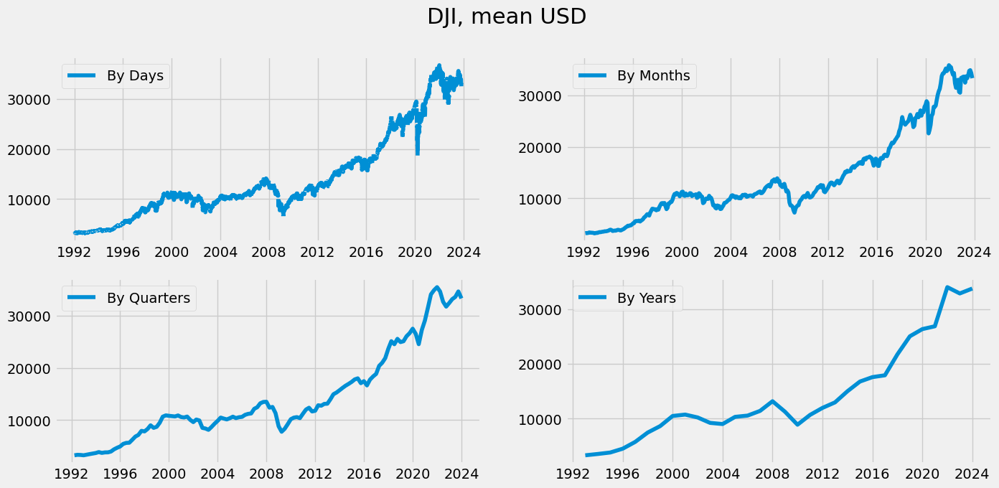

In [55]:
# PLOTS
fig = plt.figure(figsize=[15, 7])
plt.suptitle('DJI, mean USD', fontsize=22)

plt.subplot(221)
plt.plot(data_d['Weighted_Price'], '-', label='By Days')
plt.legend()

plt.subplot(222)
plt.plot(data_month['Weighted_Price'], '-', label='By Months')
plt.legend()

plt.subplot(223)
plt.plot(data_Q['Weighted_Price'], '-', label='By Quarters')
plt.legend()

plt.subplot(224)
plt.plot(data_year['Weighted_Price'], '-', label='By Years')
plt.legend()

# plt.tight_layout()
plt.show()

Stationarity check and STL-decomposition of the series

Dickey–Fuller test: p=0.993150


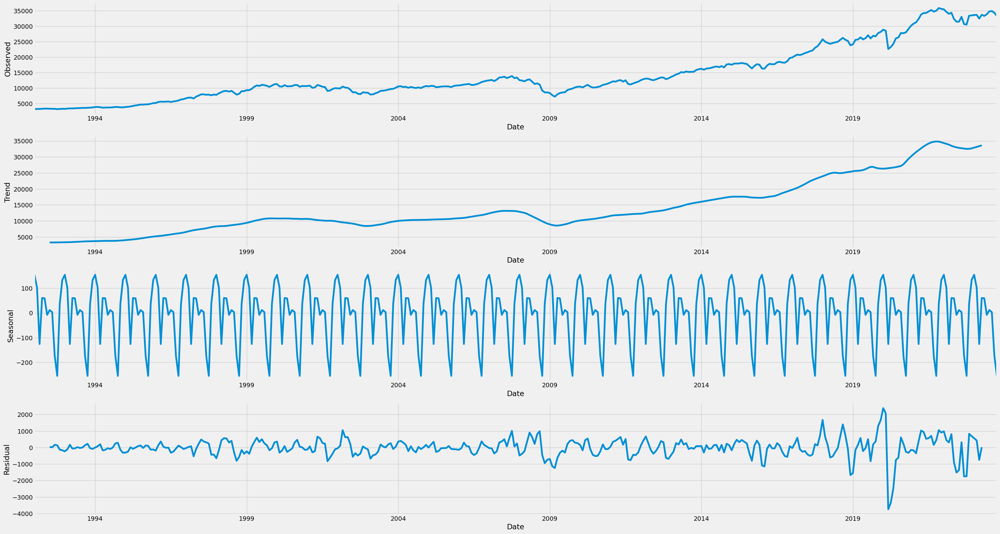

In [56]:
#Check how to plot data_month
result = sm.tsa.seasonal_decompose(data_month['Weighted_Price'], model='additive') 

# Plotting the decomposition components with adjusted size
fig, (ax1, ax2, ax3, ax4) = plt.subplots(4, 1, figsize=(35, 20))
result.observed.plot(ax=ax1)
ax1.set_ylabel('Observed')
result.trend.plot(ax=ax2)
ax2.set_ylabel('Trend')
result.seasonal.plot(ax=ax3)
ax3.set_ylabel('Seasonal')
result.resid.plot(ax=ax4)
ax4.set_ylabel('Residual')

print("Dickey–Fuller test: p=%f" % sm.tsa.stattools.adfuller(data_month['Weighted_Price'])[1])
# Display the plot
plt.show()

In [57]:
# Box-Cox Transformations
data_month['Weighted_Price_box'], lmbda = stats.boxcox(data_month.Weighted_Price)
print("Dickey–Fuller test: p=%f" % sm.tsa.stattools.adfuller(data_month.Weighted_Price)[1])

Dickey–Fuller test: p=0.993150


In [58]:
# Seasonal differentiation
data_month['prices_box_diff'] = data_month.Weighted_Price_box - data_month.Weighted_Price_box.shift(12)
print("Dickey–Fuller test: p=%f" % sm.tsa.stattools.adfuller(data_month.prices_box_diff[12:])[1])

Dickey–Fuller test: p=0.021363


Dickey–Fuller test: p=0.000000


<Figure size 1500x700 with 0 Axes>

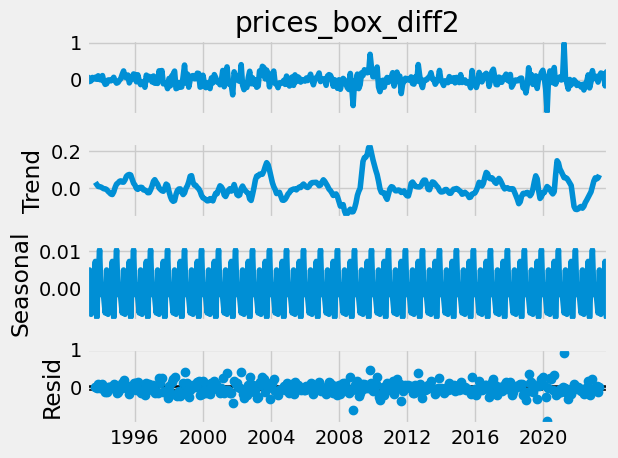

In [59]:
# Regular differentiation
data_month['prices_box_diff2'] = data_month.prices_box_diff - data_month.prices_box_diff.shift(1)
plt.figure(figsize=(15,7))

# STL-decomposition
STL = sm.tsa.seasonal_decompose(data_month.prices_box_diff2[13:])   
STL.plot()
print("Dickey–Fuller test: p=%f" % sm.tsa.stattools.adfuller(data_month.prices_box_diff2[13:])[1])

plt.show()

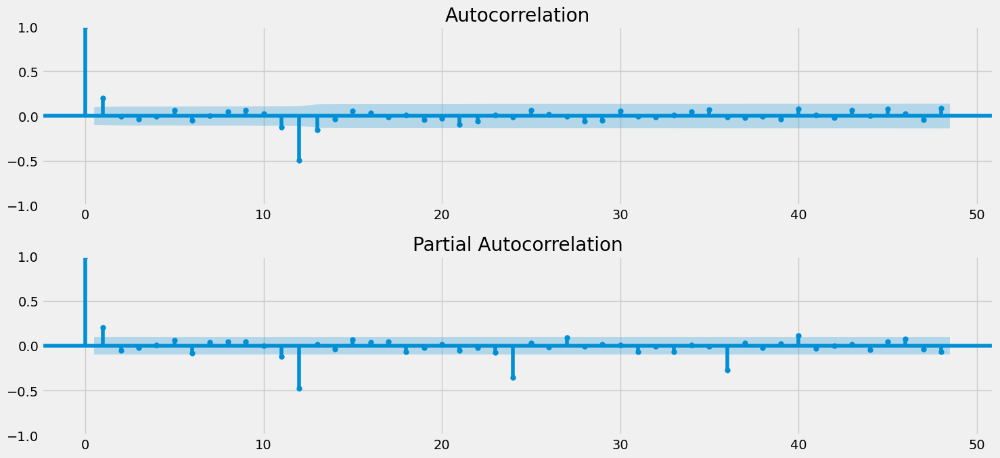

In [60]:
# Initial approximation of parameters using Autocorrelation and Partial Autocorrelation Plots
plt.figure(figsize=(15,7))
ax = plt.subplot(211)
sm.graphics.tsa.plot_acf(data_month.prices_box_diff2[13:].values.squeeze(), lags=48, ax=ax)
ax = plt.subplot(212)
sm.graphics.tsa.plot_pacf(data_month.prices_box_diff2[13:].values.squeeze(), lags=48, ax=ax)
plt.tight_layout()
plt.show()

In [61]:
# Initial approximation of parameters
Qs = range(0, 2)
qs = range(0, 3)
Ps = range(0, 3)
ps = range(0, 3)
D=1
d=1
parameters = product(ps, qs, Ps, Qs)
parameters_list = list(parameters)
len(parameters_list)

# Model Selection
results = []
best_aic = float("inf")
warnings.filterwarnings('ignore')
for param in parameters_list:
    try:
        model=sm.tsa.statespace.SARIMAX(data_month.Weighted_Price_box, order=(param[0], d, param[1]), 
                                        seasonal_order=(param[2], D, param[3], 12)).fit(disp=-1)
    except ValueError:
        print('wrong parameters:', param)
        continue
    aic = model.aic
    if aic < best_aic:
        best_model = model
        best_aic = aic
        best_param = param
    results.append([param, model.aic])

In [62]:
# Best Models
result_table = pd.DataFrame(results)
result_table.columns = ['parameters', 'aic']
print(result_table.sort_values(by = 'aic', ascending=True).head())
print(best_model.summary())

      parameters         aic
7   (0, 1, 0, 1) -507.839147
25  (1, 1, 0, 1) -507.769276
13  (0, 2, 0, 1) -506.905846
19  (1, 0, 0, 1) -506.774367
37  (2, 0, 0, 1) -506.609672
                                     SARIMAX Results                                      
Dep. Variable:                 Weighted_Price_box   No. Observations:                  382
Model:             SARIMAX(0, 1, 1)x(0, 1, 1, 12)   Log Likelihood                 256.920
Date:                            Sun, 19 Nov 2023   AIC                           -507.839
Time:                                    19:39:28   BIC                           -496.107
Sample:                                01-31-1992   HQIC                          -503.178
                                     - 10-31-2023                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
-------------------

Dickey–Fuller test:: p=0.000000


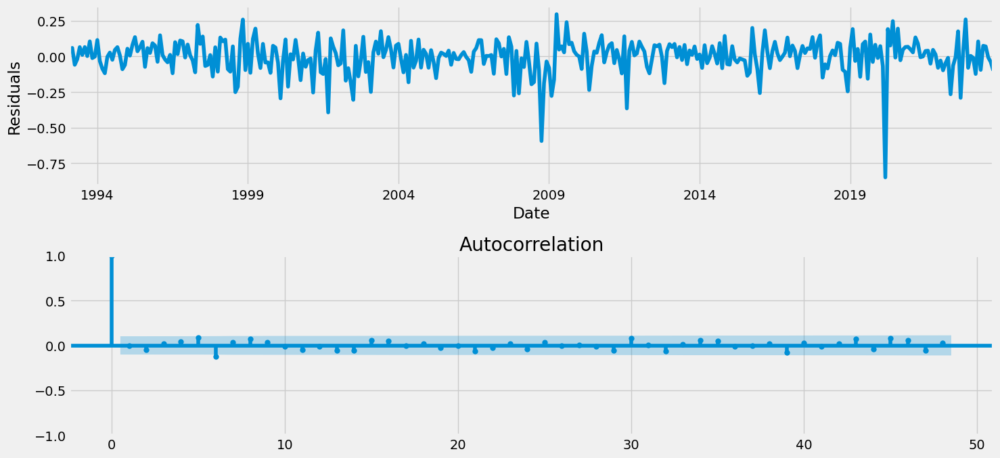

In [63]:
# STL-decomposition
plt.figure(figsize=(15,7))
plt.subplot(211)
best_model.resid[13:].plot()
plt.ylabel(u'Residuals')
ax = plt.subplot(212)
sm.graphics.tsa.plot_acf(best_model.resid[13:].values.squeeze(), lags=48, ax=ax)

print("Dickey–Fuller test:: p=%f" % sm.tsa.stattools.adfuller(best_model.resid[13:])[1])

plt.tight_layout()
plt.show()

In [64]:
# Inverse Box-Cox Transformation Function
def invboxcox(y,lmbda):
   if lmbda == 0:
      return(np.exp(y))
   else:
      return(np.exp(np.log(lmbda * y + 1) / lmbda))

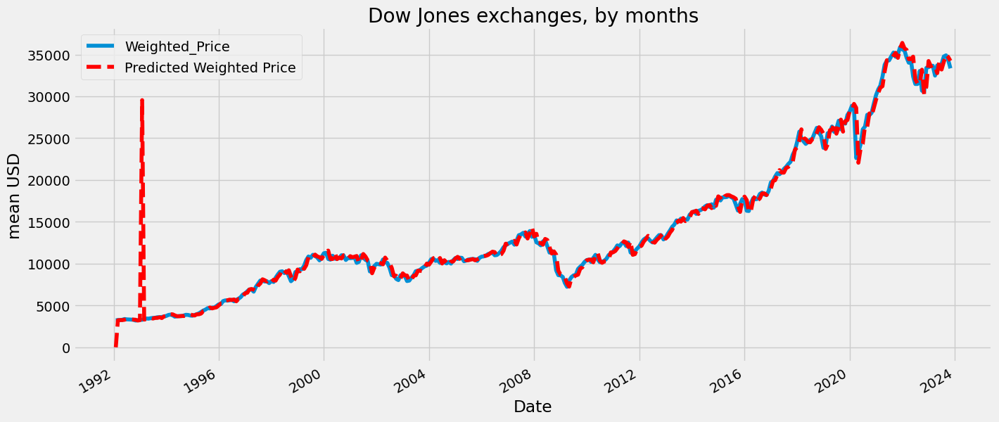

In [65]:
# Prediction
df_month2 = data_month[['Weighted_Price']]
future = pd.DataFrame(data_month['Weighted_Price'])
df_month2 = pd.concat([df_month2, future])
df_month2['forecast'] = invboxcox(best_model.predict(), lmbda)
plt.figure(figsize=(15,7))
df_month2.Weighted_Price.plot()
df_month2.forecast.plot(color='r', ls='--', label='Predicted Weighted Price')
plt.legend()
plt.title('Dow Jones exchanges, by months')
plt.ylabel('mean USD')
plt.show()

In [66]:
df_month = pd.DataFrame(df_month2, index=pd.to_datetime(df_month2.index))

# Add a new column named 'New_Column' with values equal to the index
df_month['Date'] = df_month.index

# Display the updated DataFrame
arima = df_month[['forecast', 'Date']] 

In [67]:
final_data = pd.DataFrame(final_data)

final_data['date'] = pd.to_datetime(final_data['date'])

# Set "Date" column as the index and remove the column
final_data.set_index('date', inplace=True)
final_data = final_data.rename_axis('Date')

In [68]:
final_data.head()

,Weighted_Price,lstm,xgboost
Date,,,
2018-01-02 00:00:00-05:00,24812.651562,23884.375000,20969.324219
2018-01-03 00:00:00-05:00,24892.655859,23947.908203,20964.562500
2018-01-04 00:00:00-05:00,25036.870312,24061.804688,20977.683594
2018-01-05 00:00:00-05:00,25223.691406,24208.138672,20847.820312
2018-01-08 00:00:00-05:00,25284.360156,24255.363281,20898.085938


In [69]:
arima = pd.DataFrame(arima)
arima['Date'] = pd.to_datetime(arima['Date'])

# Set "Date" column as the index and remove the column
arima.set_index('Date', inplace=True)


In [70]:
final_data.head()

,Weighted_Price,lstm,xgboost
Date,,,
2018-01-02 00:00:00-05:00,24812.651562,23884.375000,20969.324219
2018-01-03 00:00:00-05:00,24892.655859,23947.908203,20964.562500
2018-01-04 00:00:00-05:00,25036.870312,24061.804688,20977.683594
2018-01-05 00:00:00-05:00,25223.691406,24208.138672,20847.820312
2018-01-08 00:00:00-05:00,25284.360156,24255.363281,20898.085938


In [71]:
merged_data = pd.merge(final_data, arima, on='Date', how='inner')


In [72]:
merged_data.rename(columns={'Forecast': 'Arima'}, inplace=True)

In [73]:
merged_data.head()

,Weighted_Price,lstm,xgboost,forecast
Date,,,,
2018-01-31 00:00:00-05:00,26191.192188,24943.455078,20893.310547,24748.786612
2018-01-31 00:00:00-05:00,26191.192188,24943.455078,20893.310547,24748.786612
2018-02-28 00:00:00-05:00,25228.423828,24211.828125,20934.826172,26056.746395
2018-02-28 00:00:00-05:00,25228.423828,24211.828125,20934.826172,26056.746395
2018-04-30 00:00:00-04:00,24279.604297,23454.855469,21205.455078,24890.690252


In [74]:
merged_data['Date'] = merged_data.index

In [75]:
# Assuming 'Date' is in datetime format, if not, convert it using pd.to_datetime
merged_data['Date'] = pd.to_datetime(merged_data['Date'])

# Filter data between January 1, 2020, and October 31, 2023
filtered_data = merged_data[(merged_data['Date'] >= split_date) & (merged_data['Date'] <= end_date)]

# Now, create a plot with the filtered data
fig = go.Figure()

fig.add_trace(go.Scatter(x=filtered_data['Date'], y=filtered_data['Weighted_Price'], mode='lines', name='Actual'))
fig.add_trace(go.Scatter(x=filtered_data['Date'], y=filtered_data['xgboost'], mode='lines', name='XGBoost'))
fig.add_trace(go.Scatter(x=filtered_data['Date'], y=filtered_data['lstm'], mode='lines', name='LSTM'))
fig.add_trace(go.Scatter(x=filtered_data['Date'], y=filtered_data['forecast'], mode='lines', name='Arima'))

# Update layout if needed
fig.update_layout(title='Final comparison chart',
                  xaxis_title='Date',
                  yaxis_title='USD $',
                 xaxis=dict(
        range=[filtered_data['Date'].min(), filtered_data['Date'].max()],
    ))

# Show the figure
fig.show()


### Conclusion

The price prediction task, utilizing ARIMA, LSTM, and XGBoost, revealed distinct patterns in the performance of each model.

ARIMA is identified as the best-performing model among the three considered. It is particularly effective when the underlying patterns in the stock market data exhibit clear trends and seasonality.
LSTM, a type of recurrent neural network (RNN). Its ability to capture complex temporal dependencies and non-linear patterns in the data allows for more accurate predictions, especially in the presence of intricate dynamics.
XGBoost, a gradient boosting algorithm, exhibited competitive performance but fell slightly behind LSTM. While XGBoost is known for its efficiency and effectiveness in a wide range of tasks, the intricate nature of time series data may make it challenging to outperform LSTM in certain scenarios.

<b>Data Characteristics:</b>

The performance of each model might vary depending on the characteristics of the time series data. Understanding the underlying patterns and dynamics is crucial for selecting an appropriate model.

<b>Hyperparameter Tuning:</b>

Fine-tuning hyperparameters for each model could potentially enhance their performance. 


Combining the predictions of multiple models, such as an ensemble of ARIMA, LSTM, and XGBoost, might provide a more robust and accurate forecasting solution.
In conclusion, ARIMA stands out as the most effective model for the specific task of price prediction in this analysis. However, the selection of the most suitable model should consider the unique characteristics of the data and the goals of the prediction task.